# Load libraries

In [23]:
import os       # Operating system utilities
import sys

print(sys.version)  # Print Python version in use

import numpy as np                                      # Array operations
import matplotlib.pyplot as plt                         # Plotting library
import torch                                            # Main PyTorch library
import torch.optim as optim                             # Optimization algorithms
import torch.nn as nn                                   # Neural network modules
import os                                               # Operating system utilities
import glob                                             # Pattern matching
import pandas as pd                                     # Data manipulation
import imageio.v2 as imageio                            # Image manipulation - for creating GIFs
import rasterio                                         # Raster data handling
import folium                                           # Interactive maps
import re                                               # Regular expressions

from torch.utils.data import Dataset, DataLoader        # Dataset and batch data loading
from rasterio.plot import show                           # Plot raster data
from IPython.display import Image, display              # For plotting GIFs
from datetime import datetime, timedelta                # Date/time utilities
from tqdm import tqdm                                   # Progress bar
from pyproj import Transformer                          # Coordinate transformation

import deepSSF_model_scalar_move as deepSSF_model # Import the .py file containing the deepSSF model     
import deepSSF_dataset_crop_training_functions as deepSSF_training_functions # Import the .py file containing the training functions
import deepSSF_loss_pxpy_mixedLR as deepSSF_loss        # Import the .py file containing the deepSSF loss function
import deepSSF_early_stopping                           # Import the .py file containing the early stopping function  
import deepSSF_utils                                    # Import the .py file containing the utility functions 

3.12.2 | packaged by conda-forge | (main, Feb 16 2024, 20:54:21) [Clang 16.0.6 ]


## Set the device (accelerator - cuda for NVIDIA GPU or mps for Mac)

In [24]:
# Set the device to be used (GPU or CPU)
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():  # For Mac M1/M2/M3
    device = "mps"
else:
    device = "cpu"
    
print(f"Using {device} device")

if torch.backends.mps.is_available():
    # Set default tensor type for PyTorch
    torch.set_default_dtype(torch.float32)
    print('Set default tensor type to float32')

Using mps device
Set default tensor type to float32


## Set up the script

In [25]:
# Local environment setup
base_path = '..'
print("Running in local environment")

# Get today's date
today_date = datetime.today().strftime('%Y-%m-%d')

# Set random seed for reproducibility
seed = 42

# Size of the input window in number of cells/pixels - should be odd so there is a central pixel
window_size = 151 # number of cells

# Which dataset?
dataset_area = 'djelk'

Running in local environment


### Create a directory to save the outputs

If we have already run this code today, we will add update index to create a new folder

In [26]:
# Count existing directories with similar pattern
pattern = f'{base_path}/Python/outputs/model_training_S2/{dataset_area}_nxn{window_size}_CNN_move_*_{today_date}'
existing_dirs = glob.glob(pattern)
dir_index = len(existing_dirs) + 1

# Create directory with index
output_dir = f'{base_path}/Python/outputs/model_training_S2/{dataset_area}_nxn{window_size}_CNN_move_{dir_index}_{today_date}'
os.makedirs(output_dir, exist_ok=True)

print(f"Created directory: {output_dir}")


Created directory: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30


### To use an existing directory for loading a trained model

This essentially just sets the working directory so the script knows where to look for the saved model object.

In [27]:
# output_dir = f'{base_path}/Python/outputs/model_training_S2/djelk_S2_nxn151_CNN_move_1_2025-06-15'
# print(f"Output directory: {output_dir}")

# Load the GPS data

In [28]:
# Load data into dataset
csv_file = f'{base_path}/data/buffalo_{dataset_area}_all_steps_nxn151.csv'
print(f"Loading data from: {csv_file}")

buffalo_df = pd.read_csv(csv_file)
print(f"Data loaded with {len(buffalo_df)} rows and {len(buffalo_df.columns)} columns")

# For testing, use a subset of the data
buffalo_df = buffalo_df[:5000] # first n rows
# buffalo_df = buffalo_df[buffalo_df['id'] == 2005] # select a single individual

# # Subset by the time period
# start_date = '2023-01-01'
# end_date = '2023-12-31'
# buffalo_df['date'] = pd.to_datetime(buffalo_df['t1_'])
# buffalo_df = buffalo_df[(buffalo_df['date'] >= start_date) & (buffalo_df['date'] <= end_date)]

# Number of rows after filtering by date
print(f"Number of rows after filtering by date: {len(buffalo_df)}")

buffalo_df.head()

Loading data from: ../data/buffalo_djelk_all_steps_nxn151.csv
Data loaded with 105763 rows and 28 columns
Number of rows after filtering by date: 5000


,id,x1_,x2_,y1_,y2_,sl_,direction_p,ta_,t1_,t2_,...,hour_t1_cos2,yday_t1_sin1,yday_t1_cos1,yday_t1_sin2,yday_t1_cos2,hour_t2,yday_t2,bearing,bearing_sin,bearing_cos
0,2005,41969.310875,41921.521939,-1.435671e+06,-1.435654e+06,50.674891,2.802478,1.367942,2018-07-25T01:04:23Z,2018-07-25T02:04:39Z,...,0.883766,-0.398627,-0.917113,0.731173,0.682192,12.07,206.50,2.802478,0.332652,-0.943050
1,2005,41921.521939,41779.439594,-1.435654e+06,-1.435601e+06,151.845214,2.781049,-0.021429,2018-07-25T02:04:39Z,2018-07-25T03:04:17Z,...,0.999328,-0.399258,-0.916838,0.732111,0.681185,13.07,206.54,2.781049,0.352783,-0.935705
2,2005,41779.439594,41841.203272,-1.435601e+06,-1.435635e+06,70.659861,-0.507220,2.994917,2018-07-25T03:04:17Z,2018-07-25T04:04:39Z,...,0.847122,-0.399889,-0.916563,0.733048,0.680177,14.07,206.58,-0.507220,-0.485749,0.874098
3,2005,41841.203272,41655.463332,-1.435635e+06,-1.435604e+06,188.309703,2.976198,-2.799767,2018-07-25T04:04:39Z,2018-07-25T05:04:27Z,...,0.467930,-0.400520,-0.916288,0.733983,0.679168,15.07,206.62,2.976198,0.164641,-0.986354
4,2005,41655.463332,41618.651923,-1.435604e+06,-1.435608e+06,37.077972,-3.021610,0.285377,2018-07-25T05:04:27Z,2018-07-25T06:04:24Z,...,-0.036644,-0.401150,-0.916012,0.734917,0.678157,16.07,206.67,-3.021610,-0.119695,-0.992811


# Set up functions for training

### I've left these in here for now as they're specific to the cropping during training but they will likely end up in deepSSF_utils

Firstly, we need to index the Sentinel-2 layers correctly, based on the time of the simulated location. We'll do this by creating a function that takes day of the year of the simulated location and returns the correct index for the Sentinel-2 layers.

This indexing is slightly different from the indexing we used for the `deepSSF_simulations.ipynb` notebook, which was indexing NDVI layers. In that case we were indexing the layers directly, and therefore the first entry was at 0 (i.e., March was in month_index = 2). Here, we are creating a string that corresponds to the layer name, and therefore the first entry is at 1. (i.e., March will be at month_index = 3)

In [29]:
def subset_layer_vectorized(layer_data, px, py, window_size):
    """
    Efficiently subset a layer (works for both 2D and 3D arrays).
    
    Args:
        layer_data: numpy array, either 2D [H, W] or 3D [bands, H, W]
        px, py: pixel coordinates
        window_size: Size of the cropping window
        
    Returns:
        torch.Tensor: cropped patch
    """
    half_window = window_size // 2
    
    # Calculate window boundaries
    row_start = py - half_window
    row_stop = py + half_window + 1
    col_start = px - half_window
    col_stop = px + half_window + 1
    
    # Handle 2D vs 3D arrays
    if layer_data.ndim == 2: # 2D array [height, width]
        height, width = layer_data.shape
        subset = np.full((window_size, window_size), -1.0, dtype=layer_data.dtype)
        
        # Calculate valid regions (for filling in missing values with -1.0 at the boundaries)
        valid_row_start = max(0, row_start)
        valid_row_stop = min(height, row_stop)
        valid_col_start = max(0, col_start)
        valid_col_stop = min(width, col_stop)
        
        # Calculate subset indices
        subset_row_start = valid_row_start - row_start
        subset_row_stop = subset_row_start + (valid_row_stop - valid_row_start)
        subset_col_start = valid_col_start - col_start
        subset_col_stop = subset_col_start + (valid_col_stop - valid_col_start)
        
        # Copy valid region
        if valid_row_start < valid_row_stop and valid_col_start < valid_col_stop:
            subset[subset_row_start:subset_row_stop, subset_col_start:subset_col_stop] = \
                layer_data[valid_row_start:valid_row_stop, valid_col_start:valid_col_stop]
                
    else:  # 3D array [bands, height, width]
        n_bands, height, width = layer_data.shape
        subset = np.full((n_bands, window_size, window_size), -1.0, dtype=layer_data.dtype)
        
        # Calculate valid regions
        valid_row_start = max(0, row_start)
        valid_row_stop = min(height, row_stop)
        valid_col_start = max(0, col_start)
        valid_col_stop = min(width, col_stop)
        
        # Calculate subset indices
        subset_row_start = valid_row_start - row_start
        subset_row_stop = subset_row_start + (valid_row_stop - valid_row_start)
        subset_col_start = valid_col_start - col_start
        subset_col_stop = subset_col_start + (valid_col_stop - valid_col_start)
        
        # Vectorized copy for all bands
        if valid_row_start < valid_row_stop and valid_col_start < valid_col_stop:
            subset[:, subset_row_start:subset_row_stop, subset_col_start:subset_col_stop] = \
                layer_data[:, valid_row_start:valid_row_stop, valid_col_start:valid_col_stop]
    
    # Returns the subset as a PyTorch tensor, and the start indices for rows and columns
    return torch.from_numpy(subset.copy()).float(), col_start, row_start

def load_environmental_layers(layer_paths):
    """
    Load all environmental layers from the provided paths.
    
    Args:
        layer_paths: Dict containing paths to environmental layers
        
    Returns:
        dict: Dictionary with layer names as keys and numpy arrays as values
    """
    environmental_layers = {}
    
    # Load other layers
    for layer_name, layer_path in layer_paths.items():
        if isinstance(layer_path, str) and layer_path.endswith('.tif'):
            # Load TIFF file
            with rasterio.open(layer_path) as src:
                data = src.read()
                data = np.nan_to_num(data, nan=0)

                # Scale raster data to [0, 1] 
                max_value = np.nanmax(data)
                min_value = np.nanmin(data)
                print(f"Layer: {layer_name}, Max: {max_value}, Min: {min_value}")
                data = (data - min_value) / max_value
                
                if data.shape[0] == 1:
                    data = data[0]
                environmental_layers[layer_name] = data
                raster_transform = src.transform
        else:
            # Load numpy file
            environmental_layers[layer_name] = np.load(layer_path, mmap_mode='r')
    
    return environmental_layers, raster_transform

def precompute_coordinates_and_months(buffalo_df, raster_transform):
    """
    Pre-compute pixel coordinates and S2 month selection for efficiency.
    
    Args:
        buffalo_df: DataFrame with GPS locations
        raster_transform: Raster transform for coordinate conversion
        
    Returns:
        tuple: (pixel_coords, s2_months) lists
    """
    pixel_coords = []
    
    for idx, row in buffalo_df.iterrows():
        # Pixel coordinates
        x, y = row['x1_'], row['y1_']
        px, py = ~raster_transform * (x, y)
        px, py = int(np.floor(px)), int(np.floor(py))
        pixel_coords.append((px, py))
    
    return pixel_coords


# Create dataset class

Here you can set what scalar values you want added to the habitat selection layers and what are used as covariates for the movement process.

In [30]:
class BuffaloDataset(Dataset):
    def __init__(self, buffalo_df, layer_paths, window_size):
        """
        Simplified dataset class with external utility functions.
        
        Args:
            buffalo_df: DataFrame with GPS locations and scalar features
            layer_paths: Dict containing paths to environmental layers
            window_size: Size of the cropping window
            raster_transform: Raster transform for coordinate conversion
        """
        self.buffalo_df = buffalo_df.reset_index(drop=True) # Ensure clean indexing
        self.window_size = window_size
        
        # Load environmental layers using external function
        self.environmental_layers, self.raster_transform = load_environmental_layers(layer_paths)
        
        # Pre-convert scalar data to tensors
        self.scalar_to_grid_data = torch.from_numpy(
            buffalo_df[['hour_t1_sin1', 
                        'hour_t1_cos1', 
                        'yday_t1_sin1', 
                        'yday_t1_cos1',
                        'dt_hour']].values).float()
        
        # Pull out the bearing at t-1
        self.bearing_tm1 = pd.to_numeric(buffalo_df['bearing'], errors='coerce').shift(1).fillna(0)
        self.bearing_tm1 = torch.from_numpy(self.bearing_tm1.values).unsqueeze(1).float()

        # Coordinates at the current and next time step
        self.x1y1_pixel_coords = [] 
        self.x2y2_pixel_coords = []

        # iterrows() returns the index and row values, 
        # but we just need the values 
        for idx, row in self.buffalo_df.iterrows():
            
            # Pixel coordinates for the current location
            x1, y1 = row['x1_'], row['y1_']
            px1, py1 = ~self.raster_transform * (x1, y1)
            px1, py1 = int(np.floor(px1)), int(np.floor(py1))
            self.x1y1_pixel_coords.append((px1, py1))

            # Pixel coordinates for next location
            x2, y2 = row['x2_'], row['y2_']
            px2, py2 = ~self.raster_transform * (x2, y2)
            px2, py2 = int(np.floor(px2)), int(np.floor(py2))
            self.x2y2_pixel_coords.append((px2, py2))

        self.n_samples = len(buffalo_df)


    def __len__(self):
        return self.n_samples

    def __getitem__(self, index):

        # Get precomputed pixel coordinates 
        px1, py1 = self.x1y1_pixel_coords[index]
        px2, py2 = self.x2y2_pixel_coords[index]
        
        # Crop environmental layers
        cropped_layers = []
        
        # Handle raster layers
        for layer_name, layer_data in self.environmental_layers.items():
                layer_crop, col_start, row_start = subset_layer_vectorized(layer_data, px1, py1, self.window_size)
                if layer_crop.ndim == 2:
                    # If the layer is 2D, add a channel dimension
                    layer_crop = layer_crop.unsqueeze(0)
                cropped_layers.append(layer_crop)
        
        # Combine all environmental layers
        # If there are multiple layers, concatenate them along the channel dimension
        if len(cropped_layers) > 1:
            spatial_data = torch.cat(cropped_layers, dim=0)
        # If there is only one layer, it will remain as a single tensor
        else:
            spatial_data = cropped_layers[0]

        # Subtract the col_start and row_start from the pixel coordinates
        x2y2_pixel_coords = (px2 - col_start, py2 - row_start)

        return (spatial_data, 
                self.scalar_to_grid_data[index], 
                self.bearing_tm1[index], 
                x2y2_pixel_coords,
                self.raster_transform
                )

In [31]:
layer_paths = {
    'ndvi': f'{base_path}/mapping/cropped rasters/ndvi_aug_2018.tif',  # a single NDVI .tif file
    'slope': f'{base_path}/mapping/cropped rasters/slope.tif',  # slope .tif file
}

In [32]:
dataset = BuffaloDataset(
    buffalo_df=buffalo_df,
    layer_paths=layer_paths,
    window_size=window_size
)

Layer: ndvi, Max: 0.8086553812026978, Min: -0.5441046953201294
Layer: slope, Max: 15.833630561828613, Min: 0.0


In [33]:
training_split = 0.8
validation_split = 0.1
test_split = 0.1

dataset_train, dataset_val, dataset_test = torch.utils.data.random_split(dataset, [training_split, validation_split, test_split])
print(len(dataset_train))
print(len(dataset_val))
print(len(dataset_test))

4000
500
500


### Create dataloaders

In [34]:
batch_size = 64 # batch size
num_workers = 0 # 0 is recommended for Jupyter notebooks
# num_workers = min(os.cpu_count() - 1, 8) # number of workers for data loader
print("Number of CPU cores available:", os.cpu_count())
print("Number of workers for data loader:", num_workers)

dataloader_train = DataLoader(dataset=dataset_train, 
                              batch_size=batch_size, 
                              shuffle=True, 
                              num_workers=num_workers
                            #   pin_memory=torch.accelerator.is_available(),  # Only if using GPU
                              # persistent_workers=True  # Keeps workers alive between epochs
)
dataloader_val = DataLoader(dataset=dataset_val, 
                             batch_size=batch_size, 
                             shuffle=True, 
                             num_workers=num_workers
                            #  pin_memory=torch.accelerator.is_available(),  # Only if using GPU
                             # persistent_workers=True  # Keeps workers alive between epochs
)
dataloader_test = DataLoader(dataset=dataset_test, 
                              batch_size=batch_size, 
                              shuffle=True, 
                              num_workers=num_workers
                            #   pin_memory=torch.accelerator.is_available(),  # Only if using GPU
                              # persistent_workers=True  # Keeps workers alive between epochs
)

Number of CPU cores available: 10
Number of workers for data loader: 0


## Check that the dataset and dataloader are working

Feature x1 batch shape:             torch.Size([64, 2, 151, 151])
Feature x2 batch shape:             torch.Size([64, 5])
Feature x3 batch shape:             torch.Size([64, 1])
First bearing_tm1:                  tensor([2.0727])
Labels batch shape:                 torch.Size([64])
Resolution of the raster:           25.0 m/pixel
Scalar covariates:                  tensor([-0.4840,  0.8750, -0.7268, -0.6869,  1.0100])
Pixel coordinates for next step:    67, 67


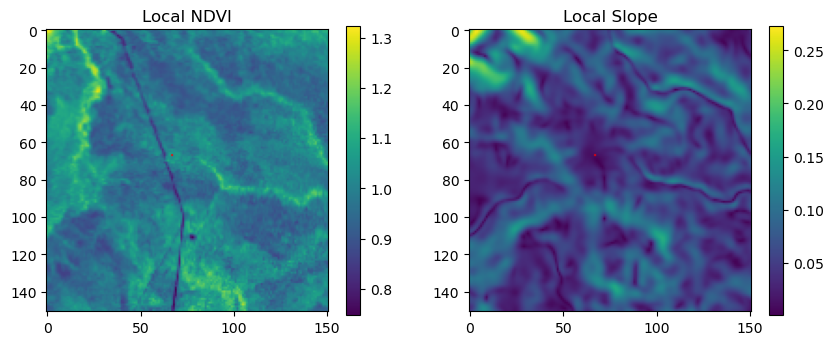

In [35]:
# Display image and label
spatial_data, scalar_to_grid_data, bearing_tm1, labels, raster_transform = next(iter(dataloader_train))
print(f"Feature x1 batch shape:             {spatial_data.size()}")
print(f"Feature x2 batch shape:             {scalar_to_grid_data.size()}")
print(f"Feature x3 batch shape:             {bearing_tm1.size()}")
print(f'First bearing_tm1:                  {bearing_tm1[0]}')

# Extract the pixel coordinates for the next step
# labels is a tuple of (x2, y2)
# where x2 and y2 are the pixel coordinates for the next step
x2, y2 = labels 
print(f"Labels batch shape:                 {labels[0].size()}")
print(f'Resolution of the raster:           {raster_transform[0][0]} m/pixel')

# print(x3.detach().numpy())
print(f'Scalar covariates:                  {scalar_to_grid_data[0,:]}')

# Convert the PyTorch tensor to a NumPy array for plotting
# Detach from the computation graph, move to CPU, and convert to NumPy
spatial_data_np = spatial_data.detach().cpu().numpy()

# Print the pixel coordinates for the next step
print(f"Pixel coordinates for next step:    {x2[0]}, {y2[0]}")

# Plot the subset
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# mask out the current location to check that it's in the middle
# mask out the next step pixel
spatial_data_np[0, :, y2[0], x2[0]] = -np.inf

# Set the colourmap to 'viridis' for better visibility
# And set NaN values to red for visibility
# Create a copy of the colormap and set the color for bad/NaN values
cmap = plt.cm.viridis.copy()
cmap.set_bad(color='red')  # Set NaN values to red (or any color you want)

# Plot each band in a separate subplot
im0 = axs[0].imshow(spatial_data_np[0,0,:,:], cmap=cmap)
axs[0].set_title('Local NDVI')
fig.colorbar(im0, ax=axs[0], shrink = 0.75)
im1 =axs[1].imshow(spatial_data_np[0,1,:,:], cmap=cmap)
axs[1].set_title('Local Slope')
fig.colorbar(im1, ax=axs[1], shrink = 0.75)

# Load the model

As we have already described the model in detail in the `deepSSF_model` script, we can simply import the model here.

We will use the same model architecture as in the previous script, except that we will need to use a slightly edited dictionary to account for the additional input channels.

## Define the parameters for the model

Here we enter the specific parameter values and hyperparameters for the model. 
These are the values that will be used to instantiate the model.

In [36]:
# Get the number of covariates in the spatial and scalar data
spatial_data, scalar_to_grid_data, bearing_tm1, labels, raster_transform = next(iter(dataloader_train))
n_spatial_layers = spatial_data.size(1)  # Number of spatial layers (bands)
n_scalar_inputs = scalar_to_grid_data.size(1)  # Number of scalar inputs
print(f"Number of spatial layers: {n_spatial_layers}") # Print the number of spatial layers
print(f"Number of scalar inputs: {n_scalar_inputs}") # Print the number of scalar inputs

# Model specific information
# These values are used to determine the number of inputs entering the fully connected block
n_max_pool_layers = 2 # used to determine the number of inputs entering the fully connected block - needs to be manually changed if the number of max pooling layers is changed
n_conv_layers = 4 # number of convolution layers in the CNN model

params_dict = {"batch_size": batch_size, #number of samples in each batch
               "image_dim": window_size, #number of pixels along the edge of each local patch/image
               "pixel_size": 25, #number of metres along the edge of a pixel
               "input_channels": n_spatial_layers + n_scalar_inputs, #number of spatial layers in each image + number of scalar layers that are converted to a grid
               "dim_in_nonspatial_to_grid": n_scalar_inputs, #the number of scalar predictors that are converted to a grid and appended to the spatial features
               "dense_dim_in_nonspatial": n_scalar_inputs, #change this to however many other scalar predictors you have (bearing, velocity etc)
               "kernel_size": 3, #the size of the 2D moving windows / kernels that are being learned
               "stride": 1, #the stride used when applying the kernel.  This reduces the dimension of the output if set to greater than 1
               "kernel_size_mp": 2, #the size of the kernel that is used in max pooling operations
               "stride_mp": 2, #the stride that is used in max pooling operations
               "padding": 1, #the amount of padding to apply to images prior to applying the 2D convolution
               "num_movement_params": 12, #number of parameters used to parameterise the movement kernel
               "dropout": 0.1, #the proportion of nodes that are dropped out in the dropout layers

               # hyperparameters that change the model architecture
               "output_channels": 4, #number of convolution filters to learn
               "output_channels_movement": 4, #number of convolution filters to learn for the movement kernel
               "dense_dim_hidden": 128, #number of nodes in the hidden layers

               # this will be updated below
               "dense_dim_in_all": n_scalar_inputs, #number of inputs entering the fully connected block once the nonspatial features have been concatenated to the spatial features
               "device": device
               }

# Now update the dictionary with calculated values
# params_dict["dense_dim_in_all"] = int(((params_dict["image_dim"] - (params_dict["image_dim"] % 2))**2) * (params_dict["output_channels_movement"] / (4**n_max_pool_layers)))

Number of spatial layers: 2
Number of scalar inputs: 5


## Instantiate the model

As described in the `deepSSF_train.ipynb` script, we saved the model definition into a file named `deepSSF_model.py`. We can instantiate the model by importing the file (which was done when importing other packages) and calling the classes parameter dictionary from that script.

In [37]:
params = deepSSF_model.ModelParams(params_dict)
model = deepSSF_model.ConvJointModel(params).to(device)
print(model)

ConvJointModel(
  (scalar_grid_output): Scalar_to_Grid_Block()
  (conv_habitat): Conv2d_block_spatial(
    (conv2d): Sequential(
      (0): Conv2d(7, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
      (4): Conv2d(4, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (fcn_movement_all): FCN_block_all_movement(
    (ffn): Sequential(
      (0): Linear(in_features=5, out_features=128, bias=True)
      (1): Dropout(p=0.1, inplace=False)
      (2): ReLU()
      (3): Linear(in_features=128, out_features=128, bias=True)
      (4): Dropout(p=0.1, inplace=False)
      (5): ReLU()
      (6): Linear(in_features=128, out_features=128, bias=True)
      (7): Dropout(p=0.1, inplace=False)
      (8): ReLU()
      (9): Linear(in_features=128, out_features=12, bias=True)
    )
  )
  (movement_grid_output): Params_to_Grid_Block_ChV()
)


# Pull out some testing data

To test the other blocks, and the full model, we will need some data. We can pull that out from the training set.

This is the same as above except that now we're pulling out a specific index. This will be the set of covariates that the model will be run on at the end of each epoch to create the training gif, so I try to find an image that looks interesting.

In [38]:
# Number of samples in the train dataset
print("Number of samples in the train dataset: ", len(dataloader_train.dataset))
print('\n')

# Select an index from the test dataset to retrieve a sample, between 0 and number of samples
# We picked this fairly arbitrarily, but with some interesting environmental features to illustrate the model's predictions
iteration_index = 55

# sample_spatial_covs is a sample of the spatial covariates for a single step
# sample_temporal_covs is a sample of the temporal covariates for a single step
# sample_prev_bearing is a sample bearing of the previous step
# sample_next_step is the target label (what we are trying to predict) for the next step

# We set these here and will also use them later in the script to check how the model's predictions look,
# and when we extract feature maps from the convolutional layers
sample_spatial_covs, sample_temporal_covs, sample_prev_bearing, sample_next_step, raster_transform = dataloader_train.dataset[iteration_index]

# 3. Reshape data tensors to add a batch dimension (since the model expects batches)
sample_spatial_covs = sample_spatial_covs.unsqueeze(0).to(device)
sample_temporal_covs = sample_temporal_covs.unsqueeze(0).to(device)
sample_prev_bearing = sample_prev_bearing.unsqueeze(0).to(device)

print(f'Shape of the sample spatial covariates:  {sample_spatial_covs.shape}')
print(f'Shape of the sample temporal covariates: {sample_temporal_covs.shape}')
print(f'Shape of the sample previous bearing:    {sample_prev_bearing.shape}')
print(f'Location of sample next step (px, py):   {sample_next_step}')

Number of samples in the train dataset:  4000


Shape of the sample spatial covariates:  torch.Size([1, 2, 151, 151])
Shape of the sample temporal covariates: torch.Size([1, 5])
Shape of the sample previous bearing:    torch.Size([1, 1])
Location of sample next step (px, py):   (75, 75)


Location of sample next step (px, py):   (75, 75)


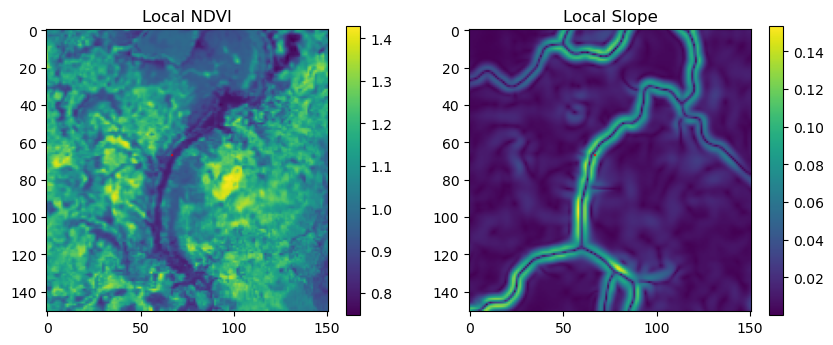

In [39]:
# Print the pixel coordinates for the next step
print(f'Location of sample next step (px, py):   {sample_next_step}')

# Convert the sample spatial covariates to a NumPy array for plotting
sample_spatial_covs_np = sample_spatial_covs.detach().cpu().numpy()

# Plot the subset
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# mask out the current location to check that it's in the middle
# mask out the next step pixel
sample_spatial_covs_np[0, :, y2[0], x2[0]] = -np.inf

# Set the colourmap to 'viridis' for better visibility
# And set NaN values to red for visibility
# Create a copy of the colormap and set the color for bad/NaN values
cmap = plt.cm.viridis.copy()
cmap.set_bad(color='red')  # Set NaN values to red (or any color you want)

# Plot each band in a separate subplot
im0 = axs[0].imshow(sample_spatial_covs_np[0,0,:,:], cmap=cmap)
axs[0].set_title('Local NDVI')
fig.colorbar(im0, ax=axs[0], shrink = 0.75)
im1 =axs[1].imshow(sample_spatial_covs_np[0,1,:,:], cmap=cmap)
axs[1].set_title('Local Slope')
fig.colorbar(im1, ax=axs[1], shrink = 0.75)

### Pull out the scalar values

In [40]:
# Extract the first sample (index 0) and its respective channel for each variable:
hour_t1_sin = sample_temporal_covs.detach().cpu().numpy()[0, 0]
hour_t1_cos = sample_temporal_covs.detach().cpu().numpy()[0, 1]
yday_t1_sin = sample_temporal_covs.detach().cpu().numpy()[0, 2]
yday_t1_cos = sample_temporal_covs.detach().cpu().numpy()[0, 3]

# Convert x3 similarly and extract the bearing from the first sample and channel:
bearing = sample_prev_bearing.detach().cpu().numpy()[0, 0]

hour_t1 = deepSSF_utils.recover_hour(hour_t1_sin, hour_t1_cos)
hour_t1_integer = int(hour_t1)  # Convert to integer
print(f'Hour:               {hour_t1_integer}')

yday_t1 = deepSSF_utils.recover_yday(yday_t1_sin, yday_t1_cos)
yday_t1_integer = int(yday_t1)  # Convert to integer
print(f'Day of the year:    {yday_t1_integer}')

bearing_degrees = np.degrees(bearing) % 360
bearing_degrees = round(bearing_degrees, 1)  # Round to 2 decimal places
bearing_degrees = int(bearing_degrees)  # Convert to integer
print(f'Bearing (radians):  {bearing}')
print(f'Bearing (degrees):  {bearing_degrees}')

Hour:               0
Day of the year:    42
Bearing (radians):  1.287877082824707
Bearing (degrees):  73


## Training loop

This code defines the main training loop for a single epoch. It iterates over batches from the training dataloader, moves the data to the correct device (e.g., CPU or GPU), calculates the loss, and performs backpropagation to update the model parameters. It also prints periodic updates of the current loss.

In [41]:
train_loop = deepSSF_training_functions.train_loop
test_loop = deepSSF_training_functions.test_loop

## Loss function

In [42]:
loss_fn = deepSSF_loss.negativeLogLikeLoss(reduction='mean')

## Early stopping

In [43]:
early_stopping = deepSSF_early_stopping.EarlyStopping

# Train the model

Here we have the main training process that loops over multiple epochs. Each epoch involves:

1. Training the model on a training dataset.
2. Validating the model on a validation dataset to monitor its performance and adjust the learning rate (via scheduler).
3. Checking for early stopping conditions. If triggered, the best model weights are restored, and a test evaluation is performed.

Additionally, commented-out code at the end shows how you might visualise and save intermediate training results (such as predicted probability surfaces) for diagnostic or research purposes. The saved images can then be combined into an animation.

In [44]:
print(f'Output directory: {output_dir}')
path_save_weights = f'{output_dir}/checkpoint_deepSSF_model.pt'
print(path_save_weights)

window_size = params_dict["image_dim"]  # Size of the input images

epochs = 50
train_losses = []  # Track training losses across epochs
val_losses = []   # Track validation losses across epochs
val_habitat_losses = []  # Track validation habitat losses across epochs
val_movement_losses = []  # Track validation movement losses across epochs
# Difference in loss between epochs
train_diff = []
val_diff = []
val_habitat_diff = []
val_movement_diff = []

# Initialize the parameter container using the parameters defined in 'params_dict'
params = deepSSF_model.ModelParams(params_dict)
# Create an instance of the ConvJointModel using the parameters,
# and move the model to the specified device (e.g., CPU or GPU)
model = deepSSF_model.ConvJointModel(params).to(device)
# Print the model architecture
print(model)

# Define the negative log-likelihood loss function with mean reduction
loss_fn = deepSSF_loss.negativeLogLikeLoss(reduction='mean') #, alpha=0.5

# Set the initial learning rates for each process
initial_learning_rate_movement = 1e-5
initial_learning_rate_habitat = 1e-4

# Create a combined optimiser for all movement-related parameters
# movement_params = list(model.conv_movement.parameters()) + list(model.fcn_movement_all.parameters())
movement_params = model.fcn_movement_all.parameters()

# Define separate optimizers for each component
optimiser_movement = optim.Adam(movement_params, lr=initial_learning_rate_movement)
optimiser_habitat = optim.Adam(model.conv_habitat.parameters(), lr=initial_learning_rate_habitat)

# Put optimisers into a tuple to call in the training loop
optimisers = (optimiser_movement, optimiser_habitat)

# Create separate schedulers for each optimizer
scheduler_movement = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimiser_movement, 'min', factor=0.1, patience=5)
scheduler_habitat = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimiser_habitat, 'min', factor=0.1, patience=5)

# Initialise early stopping 
early_stopping = deepSSF_early_stopping.EarlyStopping(patience=15, verbose=True, path=path_save_weights)

# Create directory for saving training images
os.makedirs(f'{output_dir}/training_images', exist_ok=True)
os.makedirs(f'{output_dir}/loss_images', exist_ok=True)

for t in range(epochs):

    # Initialise variables to store during training
    train_loss = 0.0
    num_train_batches = len(dataloader_train)

    val_loss = 0.0
    val_loss_habitat = 0.0
    val_loss_movement = 0.0
    num_batches = len(dataloader_val)

    print(f"Epoch {t+1}\n-------------------------------")

    # Skip training in the first epoch, but still calculate losses
    skip_training = (t == 0)

    # 1. Run the training loop for one epoch using the training dataloader
    epoch_loss = train_loop(dataloader_train, model, loss_fn, optimisers, 
                            skip_epoch0_training=skip_training,
                            batch_size=batch_size)
    
    train_losses.append(epoch_loss.item())

    # 2. Evaluate model performance on the validation dataset
    model.eval()  # Switch to evaluation mode for proper layer behavior
    with torch.no_grad():

        # Loop through each batch in the validation dataloader
        for x1, x2, x3, y, raster_transform in dataloader_val:
            # Move data to the chosen device (CPU/GPU)
            x1 = x1.to(device)
            x2 = x2.to(device)
            x3 = x3.to(device)
            # y = y.to(device)

            # if isinstance(y, list):
            #     y = torch.stack(y)

            # Accumulate validation loss
            total_loss, habitat_loss, movement_loss = loss_fn(model((x1, x2, x3)), y)
            val_loss += total_loss.detach()
            val_loss_habitat += habitat_loss.detach()
            val_loss_movement += movement_loss.detach()

    # # 3. Step the scheduler based on the validation loss (adjusts learning rate if needed)
    # scheduler.step(val_loss)

    # Step the movement scheduler
    scheduler_movement.step(val_loss_movement)

    # Step the habitat scheduler regardless of the movement weight
    scheduler_habitat.step(val_loss_habitat)

    # 4. Compute the average validation loss and print it, along with the current learning rate
    val_loss /= num_batches
    val_loss_habitat /= num_batches
    val_loss_movement /= num_batches

    print(f"Avg validation loss:            {val_loss:>15f}")
    print(f"Avg validation habitat loss:    {val_loss_habitat:>15f}")
    print(f"Avg validation movement loss:   {val_loss_movement:>15f}")
    print(f"Movement learning rate:         {scheduler_movement.get_last_lr()}")
    print(f"Habitat learning rate:          {scheduler_habitat.get_last_lr()}")

    # 5. Track the validation loss for plotting or monitoring
    val_losses.append(val_loss.item())
    val_habitat_losses.append(val_loss_habitat.item())
    val_movement_losses.append(val_loss_movement.item())

    # Memory management - add after validation but before early stopping check
    # torch.mps.empty_cache()
    # gc.collect()

    # 6. Early stopping: if no improvement in validation loss for a set patience, stop training
    early_stopping(val_loss, model)
    if early_stopping.early_stop:
        print("Early stopping")
        # Restore the best model weights saved by EarlyStopping
        model.load_state_dict(torch.load(path_save_weights, weights_only=True, map_location=device))
        test_loop(dataloader_test, model, loss_fn)  # Evaluate on test set once training stops
        break
    else:
        model.eval()
        print("\n")

    torch.cuda.empty_cache()


    # ----------------------------------------------------
    # The following code demonstrates how
    # to optionally visualize or save intermediate results
    # (e.g., habitat probability surface, movement probability,
    # and next-step probability surfaces).

    # uncomment the code all in one go to run it (it should be inside the training loop)
    # ----------------------------------------------------

    # Extract training and validation losses for plotting

    # Convert the list of tensors to a single tensor
    train_losses_np = torch.tensor(train_losses).detach().cpu().numpy()
    val_losses_np = torch.tensor(val_losses).detach().cpu().numpy()
    val_habitat_losses_np = torch.tensor(val_habitat_losses).detach().cpu().numpy()
    val_movement_losses_np = torch.tensor(val_movement_losses).detach().cpu().numpy()

    # Get the difference in losses between epochs
    train_diff.append(train_losses_np[t] - train_losses_np[t-1])
    val_diff.append(val_losses_np[t] - val_losses_np[t-1])
    val_habitat_diff.append(val_habitat_losses_np[t] - val_habitat_losses_np[t-1])
    val_movement_diff.append(val_movement_losses_np[t] - val_movement_losses_np[t-1])

    # Number of epochs
    n_epochs = len(val_losses)

    # -----------------------------------------------------------
    # 1. Retrieve a single test example (covariates and labels)
    #    at the specified 'iteration_index' from the test dataset
    # -----------------------------------------------------------
    x1, x2, x3, labels, raster_transform = dataloader_train.dataset[int(iteration_index)]

    # -----------------------------------------------------------
    # 2. Add a batch dimension and move tensors to the device
    #    for model inference
    # -----------------------------------------------------------
    x1 = x1.unsqueeze(0).to(device)
    x2 = x2.unsqueeze(0).to(device)
    x3 = x3.unsqueeze(0).to(device)

    # -----------------------------------------------------------
    # 3. Run the model on the single test example
    # -----------------------------------------------------------
    test = model((x1, x2, x3))

    # -----------------------------------------------------------
    # 4. Extract habitat and movement outputs;
    #    convert them to NumPy arrays for visualization
    # -----------------------------------------------------------
    hab_density = test.detach().cpu().numpy()[0, :, :, 0]
    movement_density = test.detach().cpu().numpy()[0, :, :, 1]

    # -----------------------------------------------------------
    # 5. Generate masks to exclude certain border cells for
    #    color scale reasons (setting them to -inf).
    # -----------------------------------------------------------
    x_mask = np.ones_like(hab_density)
    y_mask = np.ones_like(hab_density)

    # Mask out a few columns (0-2 and 98-end) and rows (0-2 and 98-end)
    x_mask[:, :n_conv_layers] = -np.inf
    x_mask[:, window_size-n_conv_layers:] = -np.inf
    y_mask[:n_conv_layers, :] = -np.inf
    y_mask[window_size-n_conv_layers:, :] = -np.inf

    # Apply the masks to habitat density
    hab_density_mask = hab_density * x_mask * y_mask

    # Combine habitat and movement densities to represent
    # next-step probability
    step_density = hab_density + movement_density
    step_density_mask = step_density * x_mask * y_mask

    # Plot the covariates
    fig, axs = plt.subplots(2, 2, figsize=(9, 7.5))

    # # Plot NDVI
    # im1 = axs[0, 0].imshow(ndvi_natural.numpy(), cmap='viridis')
    # axs[0, 0].set_title('NDVI')
    # fig.colorbar(im1, ax=axs[0, 0])

    # Plot Training and Validation Loss
    axs[0, 0].plot(range(n_epochs), train_losses_np, label='Training Loss', color='blue')
    axs[0, 0].plot(range(n_epochs), val_losses_np, label='Validation Loss', color='red')
    # to show the habitat and movement losses, uncomment the following lines (on quite different scales)
    # axs[0, 0].plot(range(n_epochs), val_habitat_losses_np, label='Validation Habitat Loss', color='green')
    # axs[0, 0].plot(range(n_epochs), val_movement_losses_np, label='Validation Movement Loss', color='orange')
    axs[0, 0].set_xlim(0, epochs)
    axs[0, 0].set_title('Training and validation loss')
    axs[0, 0].set_xlabel('Epoch')
    axs[0, 0].set_ylabel('Loss')
    axs[0, 0].legend()

    # Plot habitat selection log-probability
    im2 = axs[0, 1].imshow(hab_density_mask, cmap='viridis')
    axs[0, 1].set_title('Habitat log-probability')
    fig.colorbar(im2, ax=axs[0, 1])

    # Plot movement log-probability
    im3 = axs[1, 0].imshow(movement_density, cmap='viridis')
    axs[1, 0].set_title('Movement log-probability')
    fig.colorbar(im3, ax=axs[1, 0])

    # Plot next-step log-probability
    im4 = axs[1, 1].imshow(step_density_mask, cmap='viridis')
    axs[1, 1].set_title('Next-step log-probability')
    fig.colorbar(im4, ax=axs[1, 1])

    filename_covs = f'{output_dir}/training_images/training_epoch_index{t}_yday{yday_t1_integer}_hour{hour_t1_integer}_bearing{bearing_degrees}.png'
    plt.tight_layout()
    plt.savefig(filename_covs, dpi=150) # creates inconsistent image sizes >>> , bbox_inches='tight'
    # plt.show()
    plt.close()  # Close the figure to free memory

    # Plot the difference in the loss of each component between epochs
    filename_diff = f'{output_dir}/loss_images/training_diff_epoch_index{t}_yday{yday_t1_integer}_hour{hour_t1_integer}_bearing{bearing_degrees}.png'
    plt.axhline(y=0, color='black', linestyle='--', label='Null Probability')  # null probs
    # plt.plot(range(n_epochs), train_diff, label='Training Loss Difference', color='blue')
    # plt.plot(range(n_epochs), val_diff, label='Validation Loss Difference', color='red')
    plt.plot(range(n_epochs), val_habitat_diff, label='Validation Habitat Loss Difference', color='green')
    plt.plot(range(n_epochs), val_movement_diff, label='Validation Movement Loss Difference', color='orange')
    plt.xlim(0, epochs)
    plt.title('Habitat and movement loss difference')
    plt.xlabel('Epoch')
    plt.ylabel('Loss difference')
    plt.legend()
    plt.savefig(filename_diff, dpi=150) 
    # plt.show()
    plt.close()  # Close the figure to free memory

print("Done!")

Output directory: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30
../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/checkpoint_deepSSF_model.pt
ConvJointModel(
  (scalar_grid_output): Scalar_to_Grid_Block()
  (conv_habitat): Conv2d_block_spatial(
    (conv2d): Sequential(
      (0): Conv2d(7, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): ReLU()
      (2): Conv2d(4, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (3): ReLU()
      (4): Conv2d(4, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    )
  )
  (fcn_movement_all): FCN_block_all_movement(
    (ffn): Sequential(
      (0): Linear(in_features=5, out_features=128, bias=True)
      (1): Dropout(p=0.1, inplace=False)
      (2): ReLU()
      (3): Linear(in_features=128, out_features=128, bias=True)
      (4): Dropout(p=0.1, inplace=False)
      (5): ReLU()
      (6): Linear(in_features=128, out_features=128, bias=True)
      (7): Dropout(p=0.1, inplace=F

### Make a GIF of the training images

First, here's a function to call to make a gif from a given directory.

In [45]:
# Example sorting by the epoch number
def extract_index(filename):
    # Extract the epoch number from the filename
    # Adjust the extraction based on your naming pattern
    import re
    match = re.search(r'index(\d+)_', filename)
    if match:
        return int(match.group(1))
    return 0

def create_gif(image_folder, output_filename, fps=10):
    """
    Creates a GIF from a sequence of images in a folder.

    Parameters:
    - image_folder: Path to the folder containing images
    - output_filename: Name of the output GIF file
    - duration: Duration of each frame in seconds
    """
    # Get all png files in the specified folder, sorted by name
    images = sorted(glob.glob(os.path.join(image_folder, '*.png')), key=extract_index)

    # Check if any images were found
    if not images:
        print(f"No images found in {image_folder}")
        return

    # Read all images
    frames = [imageio.imread(image) for image in images]

    # Create the animation file
    if output_filename.endswith('.gif'):
        print(f"GIF saved as {output_filename}")
        # Save as GIF
        imageio.mimsave(output_filename, frames, fps=fps, loop=0, 
                        quantizer='nq')  # Neural-Net quantizer (better quality)
        display(Image(filename=output_filename))
    else:
        imageio.mimsave(output_filename, frames, fps=fps, quality=8)
        print(f"Animation saved as: {output_filename}")

    print(f"Animation created successfully: {output_filename}")


## Create training GIF

GIF saved as ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/training_gif_yday42_hour0_bearing73.gif


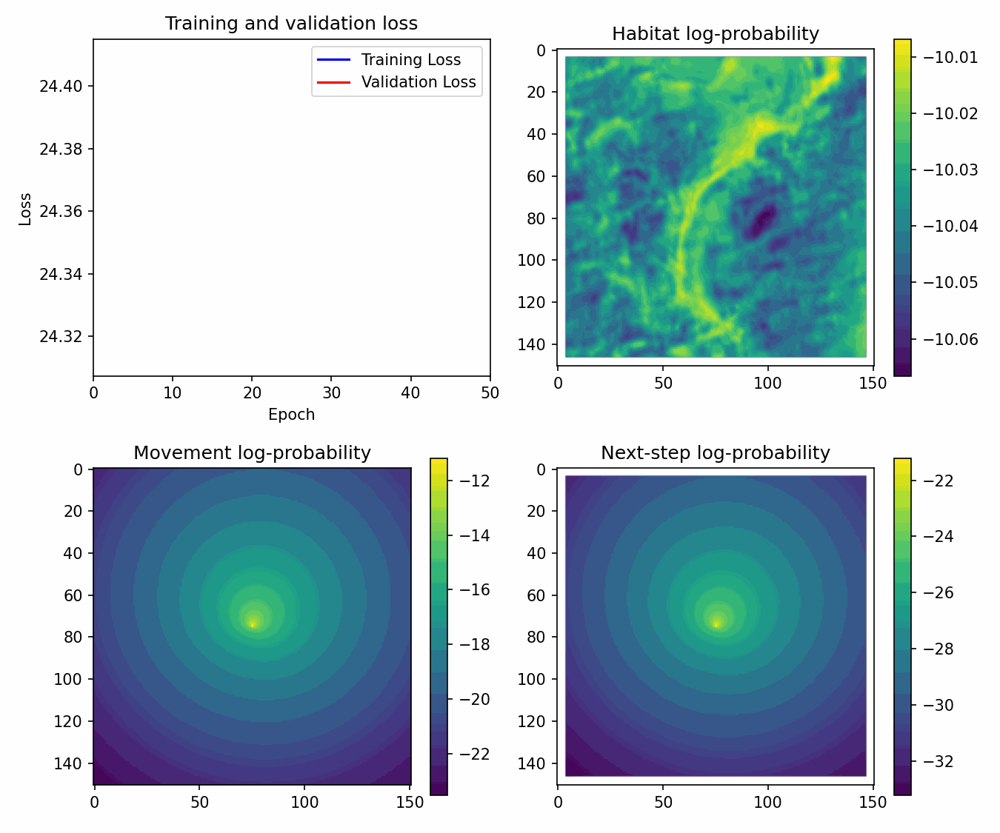

Animation created successfully: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/training_gif_yday42_hour0_bearing73.gif


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (1350, 1125) to (1360, 1136) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


Animation saved as: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/training_mp4_yday42_hour0_bearing73.mp4
Animation created successfully: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/training_mp4_yday42_hour0_bearing73.mp4


In [46]:
# Path to your images
image_folder =  f'{output_dir}/training_images'
# Output GIF filename
output_filename = f'{output_dir}/training_gif_yday{yday_t1_integer}_hour{hour_t1_integer}_bearing{bearing_degrees}.gif'
# Create the GIF
create_gif(image_folder, output_filename, fps=10)

# Output MP4 filename
output_filename = f'{output_dir}/training_mp4_yday{yday_t1_integer}_hour{hour_t1_integer}_bearing{bearing_degrees}.mp4'
# Create the MP4
create_gif(image_folder, output_filename, fps=10)

## Create loss GIF

GIF saved as ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/loss_gif.gif


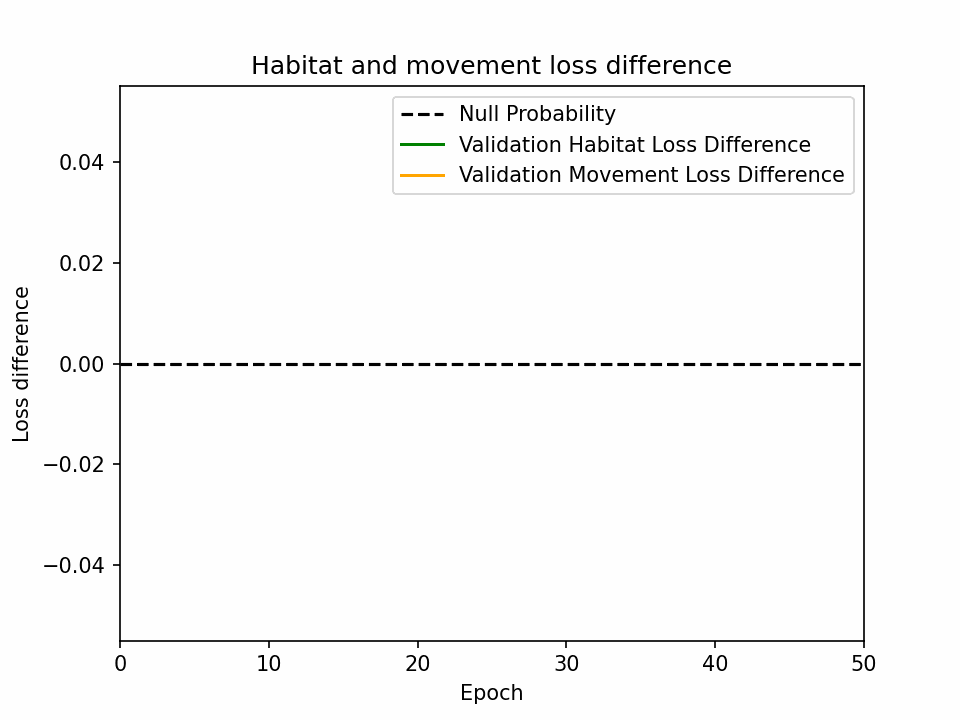

Animation created successfully: ../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/loss_gif.gif


In [47]:
# Path to your images
image_folder =  f'{output_dir}/loss_images'
# Output GIF filename
output_filename = f'{output_dir}/loss_gif.gif'
# Create the GIF
create_gif(image_folder, output_filename, fps=10)

# Loading in previous models

As we've trained the model, the model parameters are already stored in the `model` object. 

The model parameters that are being loaded must match the model object that has been defined above. If the model object has changed, the model parameters will not be able to be loaded.

We load the model object in the output directory defined at the top of the script.

In [48]:
# Print where the model weights are saved
print(os.path.join(base_path, path_save_weights))

../../Python/outputs/model_training_S2/djelk_nxn151_CNN_move_1_2025-06-30/checkpoint_deepSSF_model.pt


### If loading a previously trained model

If we want to load a model from a different directory, we can specify it manually here, but the architecture must match.

In [49]:
# to load previously saved weights
# path_save_weights_manual = f'{output_dir}/checkpoint_deepSSF_buffalo2005_2025-04-01.pt'

# model.load_state_dict(torch.load(path_save_weights_manual,
#                                  weights_only=True,
#                                  map_location=torch.device('cpu')))

# View model outputs

### Save the validation loss as a dataframe

In [50]:
# Directory for saving the loss dataframe
filename_loss_csv = f'{output_dir}/deepSSF_val_loss.csv'

# Check if val_losses is defined (which means a model has been trained in this session)
try:

    # Convert the list of tensors to a single tensor
    val_losses_tensor = torch.tensor(val_losses)

    print("val_losses has been defined - storing as csv\n")

    # Number of epochs
    n_epochs = len(val_losses)
    print(f'Number of epochs: {n_epochs}')

    val_losses_df = pd.DataFrame({
        "epoch": range(1, n_epochs + 1),
        "val_losses": val_losses_tensor.detach().cpu().numpy()
    })

    print(val_losses_df.head())

    # Save the validation losses to a CSV file
    val_losses_df.to_csv(filename_loss_csv, index=False)

# if val_losses hasn't been defined (for if you are loading model weights from a saved object)
except NameError:

    # This code runs if val_losses is not defined
    print("val_losses has not been defined - loading from saved csv\n")
    # Initialize it with a default value

    # Read the val_losses csv file
    val_losses_df = pd.read_csv(filename_loss_csv)
    print(val_losses_df.head())

    # Number of epochs
    n_epochs = len(val_losses_df)
    print(f'\nNumber of epochs: {n_epochs}')


val_losses has been defined - storing as csv

Number of epochs: 50
   epoch  val_losses
0      1   24.312304
1      2   24.244221
2      3   24.176573
3      4   24.079994
4      5   24.019131


In [51]:
# Directory for saving the loss dataframe
filename_train_loss_csv = f'{output_dir}/deepSSF_train_loss.csv'

# Check if train_losses is defined (which means a model has been trained in this session)
try:

    # Convert the list of tensors to a single tensor
    train_losses_tensor = torch.tensor(train_losses)

    print("train_losses has been defined - storing as csv\n")

    train_losses_df = pd.DataFrame({
        "epoch": np.linspace(1, n_epochs, len(train_losses)),
        "train_losses": train_losses_tensor.detach().cpu().numpy()
    })

    print(train_losses_df.head)

    # Save the train losses to a CSV file
    train_losses_df.to_csv(filename_train_loss_csv, index=False)

# if train_losses hasn't been defined (for if you are loading model weights from a saved object)
except NameError:

    # This code runs if train_losses is not defined
    print("train_losses has not been defined - loading from saved csv\n")
    # Initialize it with a default value

    # Read the train_losses csv file
    train_losses_df = pd.read_csv(filename_train_loss_csv)
    print(train_losses_df.head())


train_losses has been defined - storing as csv

<bound method NDFrame.head of     epoch  train_losses
0     1.0     24.410002
1     2.0     24.377092
2     3.0     24.309694
3     4.0     24.227150
4     5.0     24.150362
5     6.0     24.070421
6     7.0     23.973202
7     8.0     23.876287
8     9.0     23.749472
9    10.0     23.616331
10   11.0     23.477163
11   12.0     23.322149
12   13.0     23.175945
13   14.0     23.033556
14   15.0     22.896687
15   16.0     22.780996
16   17.0     22.677107
17   18.0     22.616037
18   19.0     22.561750
19   20.0     22.548388
20   21.0     22.534164
21   22.0     22.520838
22   23.0     22.512949
23   24.0     22.506466
24   25.0     22.507002
25   26.0     22.495617
26   27.0     22.496553
27   28.0     22.494749
28   29.0     22.494368
29   30.0     22.487719
30   31.0     22.477554
31   32.0     22.472557
32   33.0     22.469397
33   34.0     22.472731
34   35.0     22.472271
35   36.0     22.462770
36   37.0     22.469170
37   38.0 

### Plot the validation loss

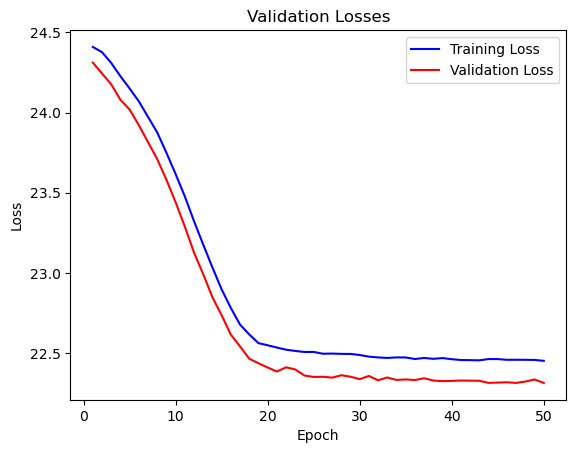

In [52]:
# Directory for saving the loss plots
filename_loss = f'{output_dir}/val_loss.png'

# Plot the validation losses
plt.plot(train_losses_df['epoch'], train_losses_df['train_losses'], label='Training Loss', color='blue')  # Plot training loss in blue
plt.plot(val_losses_df['epoch'], val_losses_df['val_losses'], label='Validation Loss', color='red')  # Plot validation loss in red
plt.title('Validation Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()  # Show legend to distinguish lines
plt.savefig(filename_loss, dpi=300, bbox_inches='tight')
plt.show()

# Test model

Take some random samples from the test dataset and generate predictions for them. We loop through the samples (which are shuffled randomly), make predictions, and plot the results.

Sample number: 475
Hour:                        15
Day of the year:             30
Bearing (radians):           -2.048119068145752
Bearing (degrees):           242
Next step is (row, column):  (97, 76)


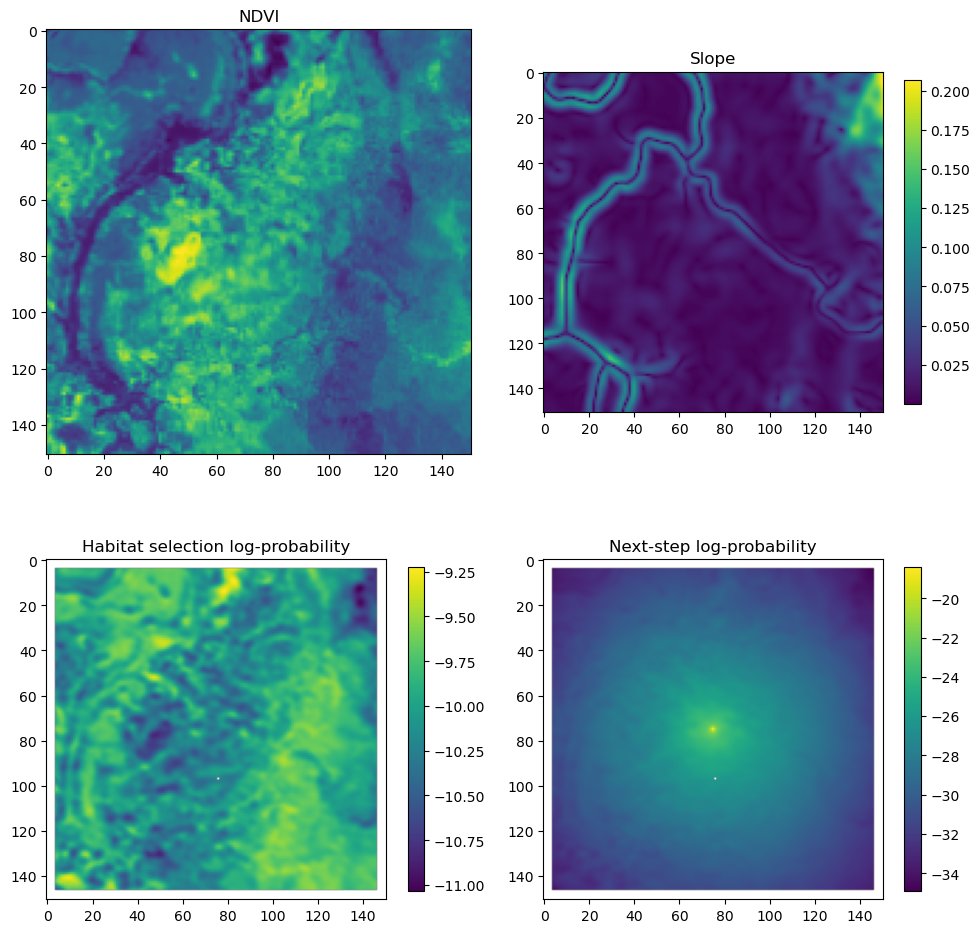

Sample number: 333
Hour:                        17
Day of the year:             336
Bearing (radians):           -2.1014809608459473
Bearing (degrees):           239
Next step is (row, column):  (58, 81)


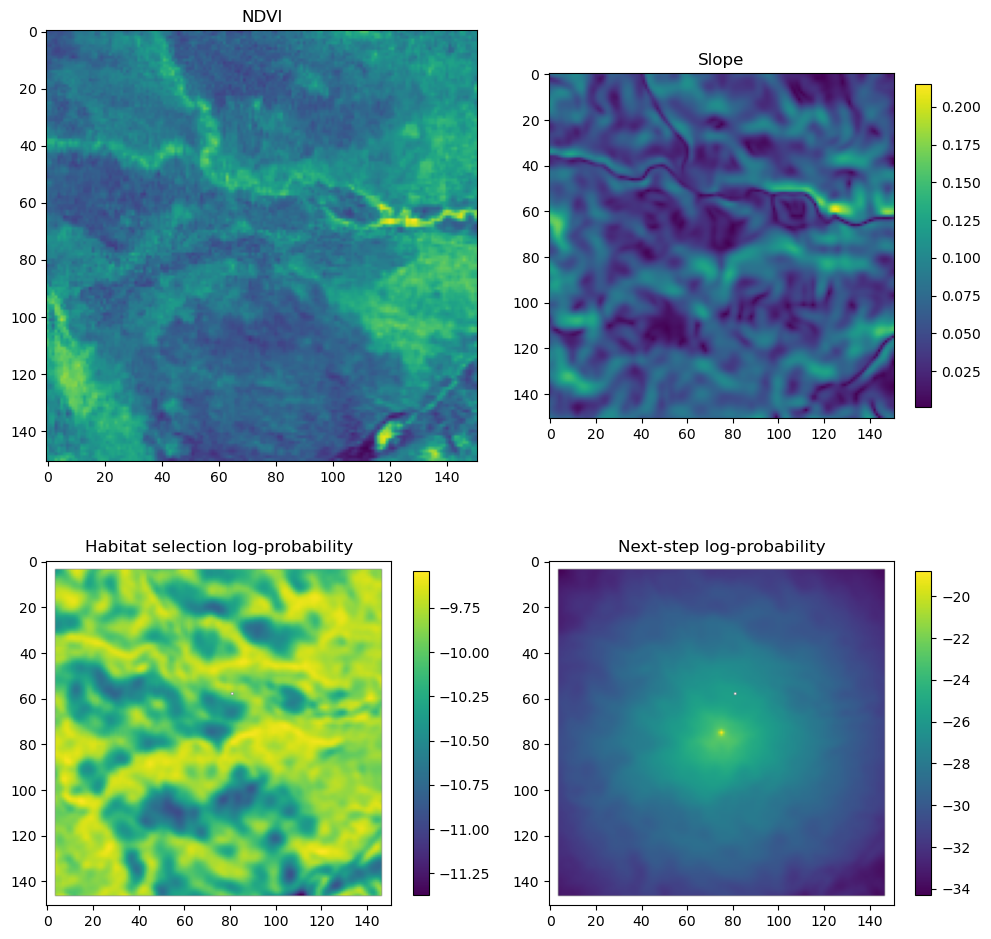

Sample number: 207
Hour:                        9
Day of the year:             357
Bearing (radians):           -0.35170435905456543
Bearing (degrees):           339
Next step is (row, column):  (78, 74)


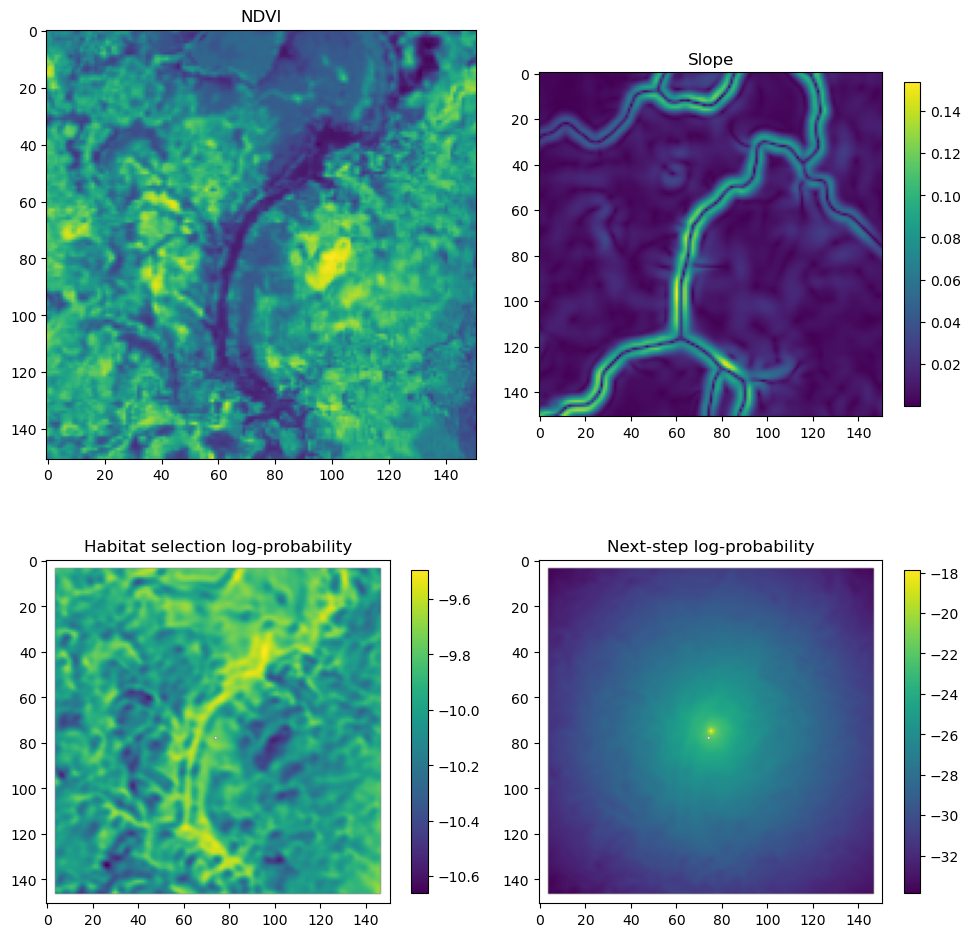

Sample number: 406
Hour:                        9
Day of the year:             220
Bearing (radians):           -0.6746960878372192
Bearing (degrees):           321
Next step is (row, column):  (78, 72)


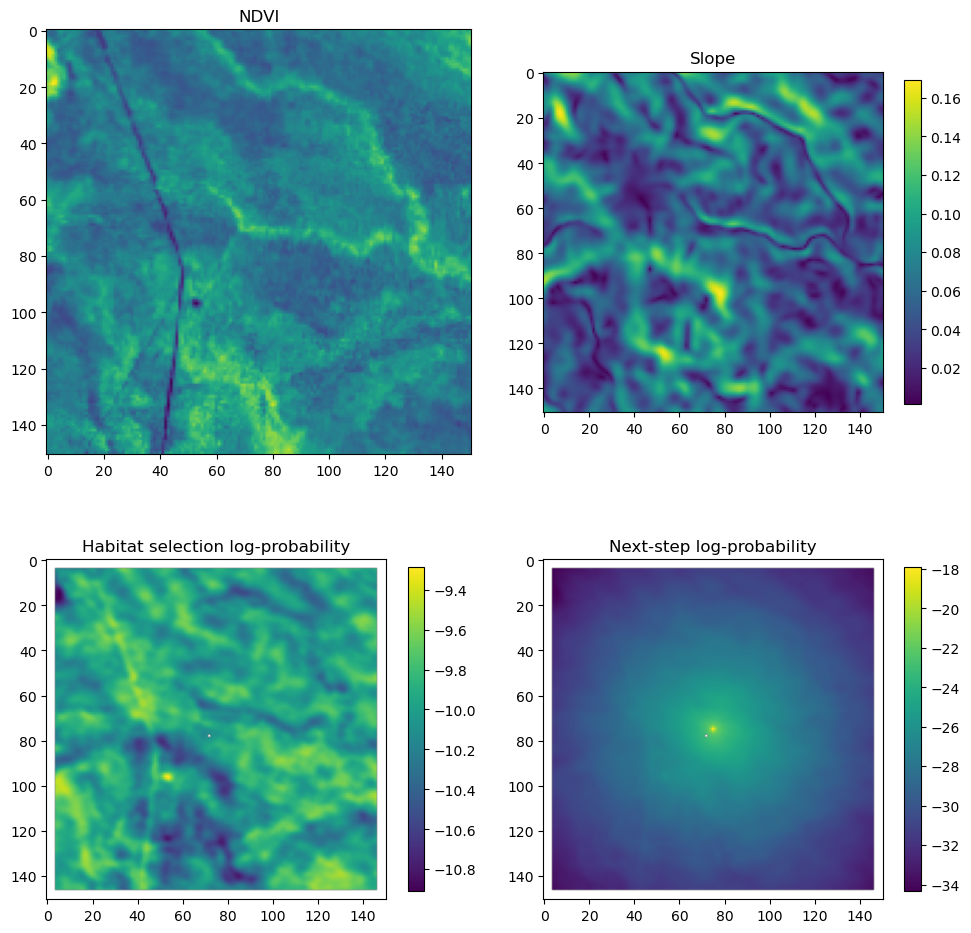

Sample number: 260
Hour:                        10
Day of the year:             8
Bearing (radians):           3.121978282928467
Bearing (degrees):           178
Next step is (row, column):  (73, 76)


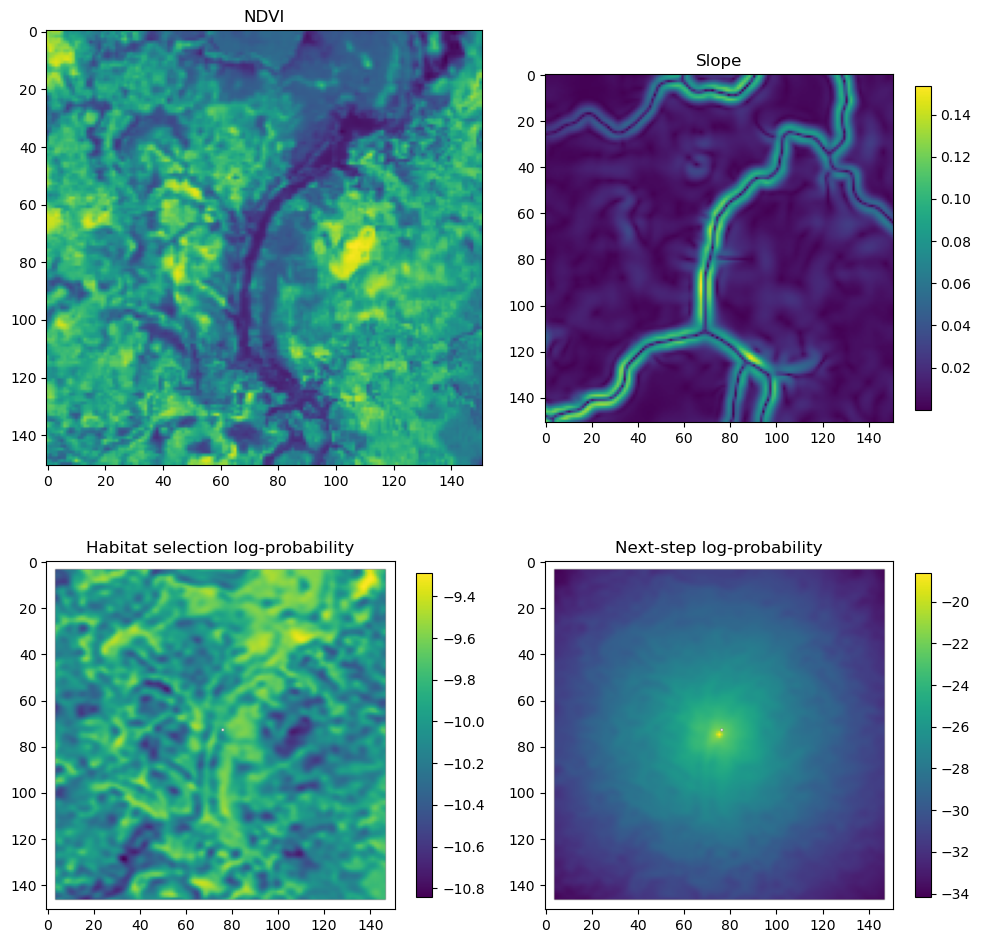

In [53]:
# 1. Set the model in evaluation mode
model.eval()

# Loop over samples in the validation dataset
for i in range(0, 5):

  sample_number = np.random.randint(0, len(dataloader_test.dataset))
  print(f'Sample number: {sample_number}')

  # Display image and label
  x1_spatial, x2_scalar, x3_bearing, labels, raster_transform = dataloader_test.dataset[sample_number]

  # Add a batch dimension
  x1_spatial = x1_spatial.unsqueeze(0).cpu()
  x2_scalar = x2_scalar.unsqueeze(0).cpu()
  x3_bearing = x3_bearing.unsqueeze(0).cpu()

  # Pull out the scalars
  hour_t1_sin1 = x2_scalar.detach().numpy()[0,0]
  hour_t1_cos1 = x2_scalar.detach().numpy()[0,1]
  yday_t1_sin1 = x2_scalar.detach().numpy()[0,2]
  yday_t1_cos1 = x2_scalar.detach().numpy()[0,3]
  bearing = x3_bearing.detach().numpy()[0,0]

  # Recover the hour
  hour_t1 = deepSSF_utils.recover_hour(hour_t1_sin1, hour_t1_cos1)
  hour_t1_integer = int(hour_t1)  # Convert to integer
  print(f'Hour:                        {hour_t1_integer}')

  # Recover the day of the year
  yday_t1 = deepSSF_utils.recover_yday(yday_t1_sin1, yday_t1_cos1)
  yday_t1_integer = int(yday_t1)  # Convert to integer
  print(f'Day of the year:             {yday_t1_integer}')

  # Recover the bearing
  bearing_degrees = np.degrees(bearing) % 360
  bearing_degrees = round(bearing_degrees, 1)  # Round to 2 decimal places
  bearing_degrees = int(bearing_degrees)  # Convert to integer
  print(f'Bearing (radians):           {bearing}')
  print(f'Bearing (degrees):           {bearing_degrees}')

  # Find the coordinates of the element that is 1
  coordinates = labels

  # Extract the coordinates
  row, column = coordinates[0], coordinates[1]
  print(f"Next step is (row, column):  ({row}, {column})")


  # -------------------------------------------------------------------------
  # Run the model on the input data
  # -------------------------------------------------------------------------

  # Move input tensors to the GPU if available
  x1_spatial = x1_spatial.to(device)
  x2_scalar = x2_scalar.to(device)
  x3_bearing = x3_bearing.to(device)

  test = model((x1_spatial, x2_scalar, x3_bearing))
  # print(test.shape)

  # Extract and exponentiate the habitat density channel
  hab_density = test.detach().cpu().numpy()[0, :, :, 0]
  hab_density_exp = np.exp(hab_density)
  # print(np.sum(hab_density_exp))  # Debug: check the sum of exponentiated values

  # Create masks to remove unwanted edge cells from visualization
  #    (setting them to -∞ affects the color scale in plots)
  x_mask = np.ones_like(hab_density)
  y_mask = np.ones_like(hab_density)

  # mask out cells on the edges that affect the colour scale
  x_mask[:, :n_conv_layers] = -np.inf
  x_mask[:, window_size-n_conv_layers:] = -np.inf
  y_mask[:n_conv_layers, :] = -np.inf
  y_mask[window_size-n_conv_layers:, :] = -np.inf

  next_step_mask = np.ones_like(hab_density)
  next_step_mask[row, column] = -np.inf

  # Apply the masks to the habitat density (log scale) and exponentiated version
  hab_density_mask = hab_density * x_mask * y_mask * next_step_mask
  hab_density_exp_mask = hab_density_exp * x_mask * y_mask * next_step_mask

  # Extract and exponentiate the movement density channel
  move_density = test.detach().cpu().numpy()[0,:,:,1]
  move_density_exp = np.exp(move_density)

  # Apply the same masking strategy to movement densities
  move_density_mask = move_density * x_mask * y_mask * next_step_mask
  move_density_exp_mask = move_density_exp * x_mask * y_mask * next_step_mask

  # Compute the next-step density by adding habitat + movement (log-space)
  step_density = test[0, :, :, 0] + test[0, :, :, 1]
  step_density = step_density.detach().cpu().numpy()
  step_density_exp = np.exp(step_density)

  # Apply masks to the step densities (log and exponentiated)
  step_density_mask = step_density * x_mask * y_mask * next_step_mask
  step_density_exp_mask = step_density_exp * x_mask * y_mask * next_step_mask

  # -------------------------------------------------------------------------
  # Plot the RGB image, slope, habitat selection, and movement density
  #   Change the panels to visualize different layers
  # -------------------------------------------------------------------------
  fig, axs = plt.subplots(2, 2, figsize=(10, 10))

  # Plot RGB
  im1 = axs[0, 0].imshow(x1_spatial.detach().cpu().numpy()[0,0,:,:])
  axs[0, 0].set_title('NDVI')

  # Plot slope
  im2 = axs[0, 1].imshow(x1_spatial.detach().cpu().numpy()[0,1,:,:], cmap='viridis')
  axs[0, 1].set_title('Slope')
  fig.colorbar(im2, ax=axs[0, 1], shrink=0.7)

  # Plot habitat selection
  im3 = axs[1, 0].imshow(hab_density_mask, cmap='viridis')
  axs[1, 0].set_title('Habitat selection log-probability')
  fig.colorbar(im3, ax=axs[1, 0], shrink=0.7)

  # # Movement density (change the axis and uncomment one of the other panels)
  # im3 = axs[1, 0].imshow(move_density_mask, cmap='viridis')
  # axs[1, 0].set_title('Movement log-probability')
  # fig.colorbar(im3, ax=axs[0, 1], shrink=0.7)

  # Next-step probability
  im4 = axs[1, 1].imshow(step_density_mask, cmap='viridis')
  axs[1, 1].set_title('Next-step log-probability')
  fig.colorbar(im4, ax=axs[1, 1], shrink=0.7)

  # Save the figure
  filename_covs = f'{output_dir}/deepSSF_S2_slope_id_yday{yday_t1_integer}_hour{hour_t1_integer}_bearing{bearing_degrees}_next_r{row}_c{column}.png'
  plt.tight_layout()
  plt.savefig(filename_covs, dpi=600, bbox_inches='tight')
  plt.show()
  plt.close()  # Close the figure to free memory


# Checking estimated movement parameters

Similarly to the convolutional layers, we can set hooks to extract the predicted movement parameters from the model, and assess how variable that is across samples.

In [54]:
# -------------------------------------------------------------------------
# Create a list to store the intermediate output from the fully connected
#    movement sub-network (fcn_movement_all)
# -------------------------------------------------------------------------
intermediate_output = []

def hook(module, input, output):
    """
    Hook function that captures the output of the specified layer
    (fcn_movement_all) during the forward pass.
    """
    intermediate_output.append(output)

# -------------------------------------------------------------------------
# Register the forward hook on 'fcn_movement_all', so its outputs
#    are recorded every time the model does a forward pass.
# -------------------------------------------------------------------------
hook_handle = model.fcn_movement_all.register_forward_hook(hook)

# -------------------------------------------------------------------------
# Perform a forward pass with the model in evaluation mode,
#    disabling gradient computation.
# -------------------------------------------------------------------------
model.eval()
with torch.no_grad():
    final_output = model((x1, x2, x3))

# -------------------------------------------------------------------------
# Inspect the captured intermediate output
#    'intermediate_output[0]' corresponds to the first (and only) forward pass.
# -------------------------------------------------------------------------
print("Intermediate output shape:", intermediate_output[0].shape)
print("Intermediate output values:", intermediate_output[0][0])

# -------------------------------------------------------------------------
# Remove the hook to avoid repeated capturing in subsequent passes
# -------------------------------------------------------------------------
hook_handle.remove()

# -------------------------------------------------------------------------
# Unpack the parameters from the FCN output (assumes a specific ordering)
# -------------------------------------------------------------------------
gamma_shape1, gamma_scale1, gamma_weight1, \
gamma_shape2, gamma_scale2, gamma_weight2, \
vonmises_mu1, vonmises_kappa1, vonmises_weight1, \
vonmises_mu2, vonmises_kappa2, vonmises_weight2 = intermediate_output[0][0].cpu()

# -------------------------------------------------------------------------
# Convert parameters from log-space (if applicable) and print them
#    Gamma and von Mises parameters
# -------------------------------------------------------------------------
# --- Gamma #1 ---
print("Gamma shape 1:", torch.exp(gamma_shape1))
print("Gamma scale 1:", torch.exp(gamma_scale1))
print("Gamma weight 1:",
      torch.exp(gamma_weight1) / (torch.exp(gamma_weight1) + torch.exp(gamma_weight2)))

# --- Gamma #2 ---
print("Gamma shape 2:", torch.exp(gamma_shape2))
print("Gamma scale 2:", torch.exp(gamma_scale2) * 500)  # scale factor 500
print("Gamma weight 2:",
      torch.exp(gamma_weight2) / (torch.exp(gamma_weight1) + torch.exp(gamma_weight2)))

# --- von Mises #1 ---
# % (2*np.pi) ensures the mu (angle) is wrapped within [0, 2π)
print("Von Mises mu 1:", vonmises_mu1 % (2*np.pi))
print("Von Mises kappa 1:", torch.exp(vonmises_kappa1))
print("Von Mises weight 1:",
      torch.exp(vonmises_weight1) / (torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2)))

# --- von Mises #2 ---
print("Von Mises mu 2:", vonmises_mu2 % (2*np.pi))
print("Von Mises kappa 2:", torch.exp(vonmises_kappa2))
print("Von Mises weight 2:",
      torch.exp(vonmises_weight2) / (torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2)))


Intermediate output shape: torch.Size([1, 12])
Intermediate output values: tensor([ 1.1009,  1.4006, -1.1442, -0.0677, -0.4314,  1.2910,  0.1757, -1.3968,
         0.8907, -0.5672, -0.6387, -0.6540], device='mps:0')
Gamma shape 1: tensor(3.0069)
Gamma scale 1: tensor(4.0574)
Gamma weight 1: tensor(0.0805)
Gamma shape 2: tensor(0.9345)
Gamma scale 2: tensor(324.7952)
Gamma weight 2: tensor(0.9195)
Von Mises mu 1: tensor(0.1757)
Von Mises kappa 1: tensor(0.2474)
Von Mises weight 1: tensor(0.8241)
Von Mises mu 2: tensor(5.7160)
Von Mises kappa 2: tensor(0.5280)
Von Mises weight 2: tensor(0.1759)


## Plot the movement distributions

We can use the movement parameters to plot the step length and turning angle distributions for the sample covariates.

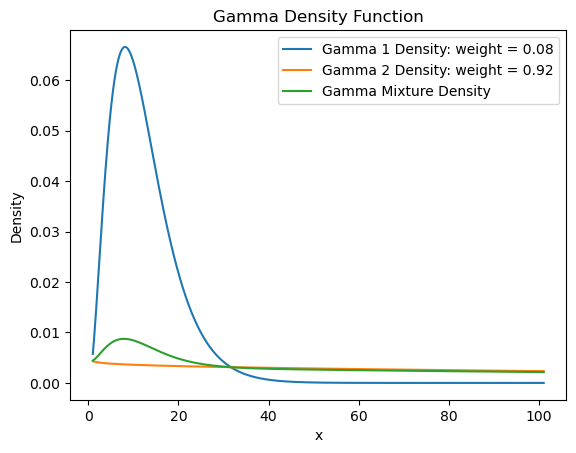

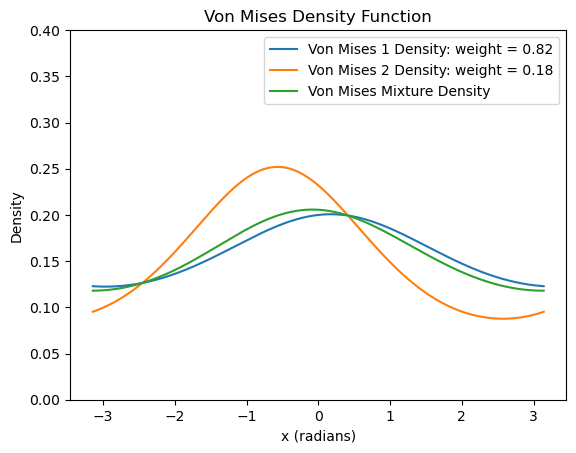

In [55]:
# -------------------------------------------------------------------------
# Define helper functions for calculating Gamma and von Mises log-densities
# -------------------------------------------------------------------------
def gamma_density(x, shape, scale):
    """
    Computes the log of the Gamma density for each value in x.

    Args:
      x (Tensor): Input values for which to compute the density.
      shape (float): Gamma shape parameter
      scale (float): Gamma scale parameter

    Returns:
      Tensor: The log of the Gamma probability density at each x.
    """
    return -1*torch.lgamma(shape) - shape*torch.log(scale) \
           + (shape - 1)*torch.log(x) - x/scale

def vonmises_density(x, kappa, vm_mu):
    """
    Computes the log of the von Mises density for each value in x.

    Args:
      x (Tensor): Input angles in radians.
      kappa (float): Concentration parameter (kappa)
      vm_mu (float): Mean direction parameter (mu)

    Returns:
      Tensor: The log of the von Mises probability density at each x.
    """
    return kappa*torch.cos(x - vm_mu) - 1*(np.log(2*torch.pi) + torch.log(torch.special.i0(kappa)))    


# -------------------------------------------------------------------------
# Round and display the mixture weights for the Gamma distributions
# -------------------------------------------------------------------------
gamma_weight1_recovered = torch.exp(gamma_weight1)/(torch.exp(gamma_weight1) + torch.exp(gamma_weight2))
rounded_gamma_weight1 = round(gamma_weight1_recovered.item(), 2)

gamma_weight2_recovered = torch.exp(gamma_weight2)/(torch.exp(gamma_weight1) + torch.exp(gamma_weight2))
rounded_gamma_weight2 = round(gamma_weight2_recovered.item(), 2)

# -------------------------------------------------------------------------
# Round and display the mixture weights for the von Mises distributions
# -------------------------------------------------------------------------
vonmises_weight1_recovered = torch.exp(vonmises_weight1)/(torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2))
rounded_vm_weight1 = round(vonmises_weight1_recovered.item(), 2)

vonmises_weight2_recovered = torch.exp(vonmises_weight2)/(torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2))
rounded_vm_weight2 = round(vonmises_weight2_recovered.item(), 2)


# -------------------------------------------------------------------------
# 1. Plotting the Gamma mixture distribution
#    a) Generate x values
#    b) Compute individual Gamma log densities
#    c) Exponentiate and combine using recovered weights
# -------------------------------------------------------------------------
x_values = torch.linspace(1, 101, 1000).to(device)
gamma1_density = gamma_density(x_values, torch.exp(gamma_shape1), torch.exp(gamma_scale1))
gamma2_density = gamma_density(x_values, torch.exp(gamma_shape2), torch.exp(gamma_scale2)*500)
gamma_mixture_density = gamma_weight1_recovered*torch.exp(gamma1_density) \
                        + gamma_weight2_recovered*torch.exp(gamma2_density)

# Move results to CPU and convert to NumPy for plotting
x_values_np = x_values.cpu().numpy()
gamma1_density_np = np.exp(gamma1_density.cpu().numpy())
gamma2_density_np = np.exp(gamma2_density.cpu().numpy())
gamma_mixture_density_np = gamma_mixture_density.cpu().numpy()

# -------------------------------------------------------------------------
# 2. Plot the Gamma distributions and their mixture
# -------------------------------------------------------------------------
plt.plot(x_values_np, gamma1_density_np, label=f'Gamma 1 Density: weight = {rounded_gamma_weight1}')
plt.plot(x_values_np, gamma2_density_np, label=f'Gamma 2 Density: weight = {rounded_gamma_weight2}')
plt.plot(x_values_np, gamma_mixture_density_np, label='Gamma Mixture Density')
plt.xlabel('x')
plt.ylabel('Density')
plt.title('Gamma Density Function')
plt.legend()
plt.show()


# -------------------------------------------------------------------------
# 3. Plotting the von Mises mixture distribution
#    a) Generate x values from -π to π
#    b) Compute individual von Mises log densities
#    c) Exponentiate and combine using recovered weights
# -------------------------------------------------------------------------
x_values = torch.linspace(-np.pi, np.pi, 1000).to(device)
vonmises1_density = vonmises_density(x_values, torch.exp(vonmises_kappa1), vonmises_mu1)
vonmises2_density = vonmises_density(x_values, torch.exp(vonmises_kappa2), vonmises_mu2)
vonmises_mixture_density = vonmises_weight1_recovered*torch.exp(vonmises1_density) \
                           + vonmises_weight2_recovered*torch.exp(vonmises2_density)

# Move results to CPU and convert to NumPy for plotting
x_values_np = x_values.cpu().numpy()
vonmises1_density_np = np.exp(vonmises1_density.cpu().numpy())
vonmises2_density_np = np.exp(vonmises2_density.cpu().numpy())
vonmises_mixture_density_np = vonmises_mixture_density.cpu().numpy()

# -------------------------------------------------------------------------
# 4. Plot the von Mises distributions and their mixture
# -------------------------------------------------------------------------
plt.plot(x_values_np, vonmises1_density_np, label=f'Von Mises 1 Density: weight = {rounded_vm_weight1}')
plt.plot(x_values_np, vonmises2_density_np, label=f'Von Mises 2 Density: weight = {rounded_vm_weight2}')
plt.plot(x_values_np, vonmises_mixture_density_np, label='Von Mises Mixture Density')
plt.xlabel('x (radians)')
plt.ylabel('Density')
plt.title('Von Mises Density Function')
plt.ylim(0, 0.4)  # Set a limit for the y-axis
plt.legend()
plt.show()


## Generate a distribution of movement parameters

To see how variable the movement parameters are across samples, we can generate a distribution of movement parameters from a batch of samples.

We take the code from above that we used to create the DataLoader for the test data and increase the batch size (to get more samples to create the distribution from).

As we're not using the test dataset any more, we'll just put all of the samples in the same batch, and generate movement parameters for all of them.

In [56]:
print(f'There are {len(dataset_test)} samples in the test dataset')
bs = len(dataset_test) # batch size
bs = 100
dataloader_test = DataLoader(dataset=dataset_test, batch_size=bs, shuffle=True)

There are 500 samples in the test dataset


Take all of the samples from the test dataset and put them in a single batch.

In [57]:
# -----------------------------------------------------------
# Fetch a batch of data from the training dataloader
# -----------------------------------------------------------
x1_batch, x2_batch, x3_batch, labels, _ = next(iter(dataloader_test))

x1_batch = x1_batch.to(device)
x2_batch = x2_batch.to(device)
x3_batch = x3_batch.to(device)
# labels = labels.to(device)

# -----------------------------------------------------------
# Register a forward hook to capture the outputs
#    from 'fcn_movement_all' during the forward pass
# -----------------------------------------------------------
hook_handle = model.fcn_movement_all.register_forward_hook(hook)

# -----------------------------------------------------------
# Perform a forward pass in evaluation mode to generate
#    and capture the sub-network's outputs in 'intermediate_output'
# -----------------------------------------------------------
model.eval()  # Disables certain layers like dropout

# Pass the batch through the model
final_output = model((x1_batch, x2_batch, x3_batch))

# -----------------------------------------------------------
# Prepare lists to store the distribution parameters
#    for each sample in the batch
# -----------------------------------------------------------
gamma_shape1_list = []
gamma_scale1_list = []
gamma_weight1_list = []
gamma_shape2_list = []
gamma_scale2_list = []
gamma_weight2_list = []
vonmises_mu1_list = []
vonmises_kappa1_list = []
vonmises_weight1_list = []
vonmises_mu2_list = []
vonmises_kappa2_list = []
vonmises_weight2_list = []

# -----------------------------------------------------------
# Extract parameters from 'intermediate_output'
#    for every sample in the batch
# -----------------------------------------------------------
for batch_output in intermediate_output:
    # Each 'batch_output' corresponds to one forward pass;
    # it might contain multiple samples if the batch size > 1
    for sample_output in batch_output:
        # Unpack the 12 parameters of the Gamma and von Mises mixtures
        gamma_shape1, gamma_scale1, gamma_weight1, \
        gamma_shape2, gamma_scale2, gamma_weight2, \
        vonmises_mu1, vonmises_kappa1, vonmises_weight1, \
        vonmises_mu2, vonmises_kappa2, vonmises_weight2 = sample_output

        # Convert log-space parameters to real space, then store
        gamma_shape1_list.append(torch.exp(gamma_shape1).item())
        gamma_scale1_list.append(torch.exp(gamma_scale1).item())
        gamma_weight1_list.append(
            (torch.exp(gamma_weight1)/(torch.exp(gamma_weight1) + torch.exp(gamma_weight2))).item()
        )
        gamma_shape2_list.append(torch.exp(gamma_shape2).item())
        gamma_scale2_list.append((torch.exp(gamma_scale2)*500).item())  # scale factor 500
        gamma_weight2_list.append(
            (torch.exp(gamma_weight2)/(torch.exp(gamma_weight1) + torch.exp(gamma_weight2))).item()
        )
        vonmises_mu1_list.append((vonmises_mu1 % (2*np.pi)).item())
        vonmises_kappa1_list.append(torch.exp(vonmises_kappa1).item())
        vonmises_weight1_list.append(
            (torch.exp(vonmises_weight1)/(torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2))).item()
        )
        vonmises_mu2_list.append((vonmises_mu2 % (2*np.pi)).item())
        vonmises_kappa2_list.append(torch.exp(vonmises_kappa2).item())
        vonmises_weight2_list.append(
            (torch.exp(vonmises_weight2)/(torch.exp(vonmises_weight1) + torch.exp(vonmises_weight2))).item()
        )


### Plot the distribution of movement parameters

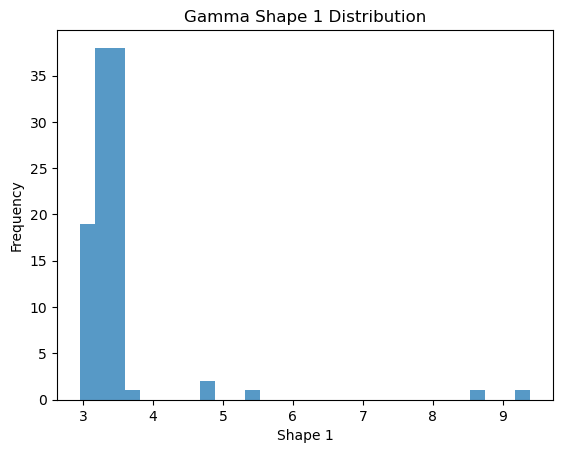

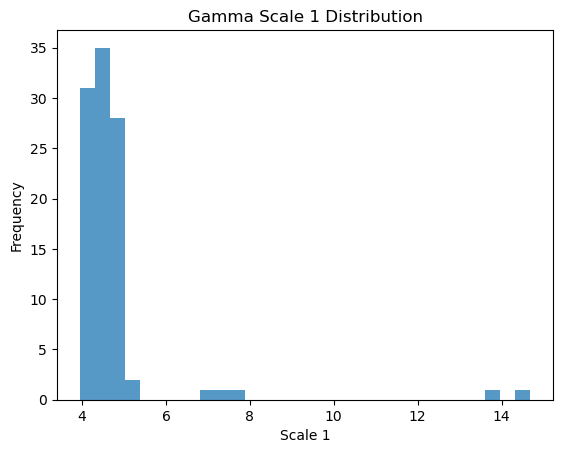

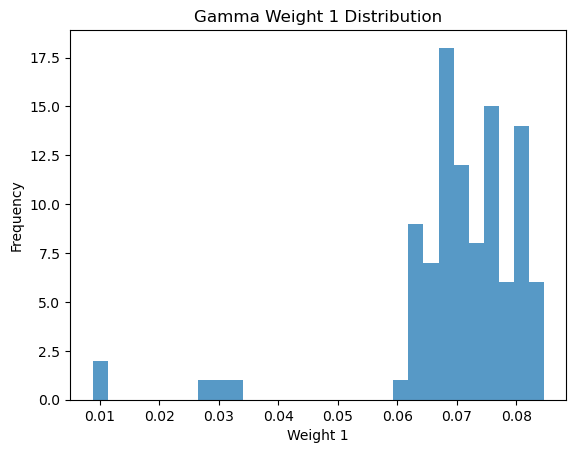

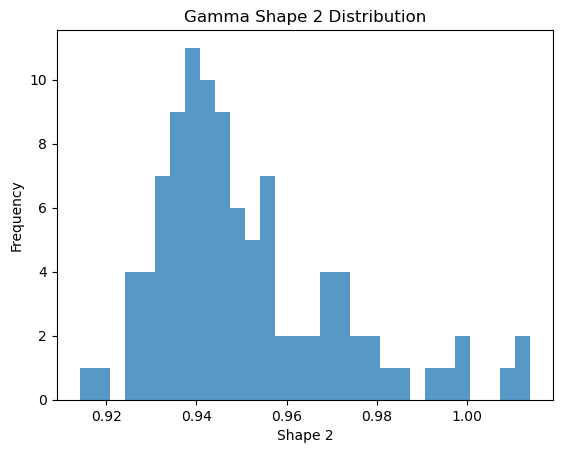

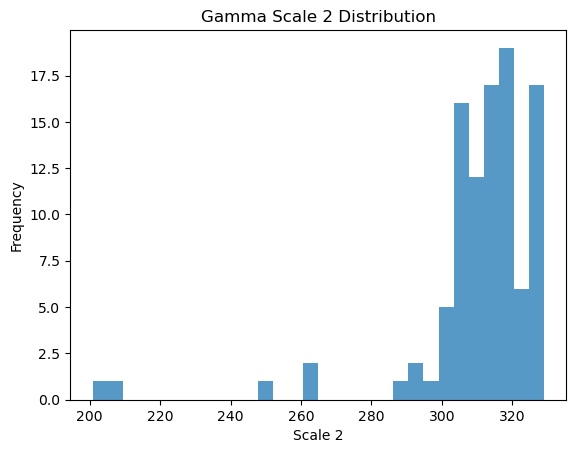

...

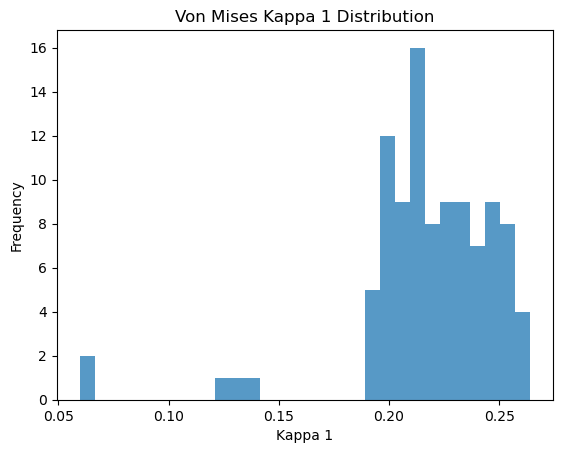

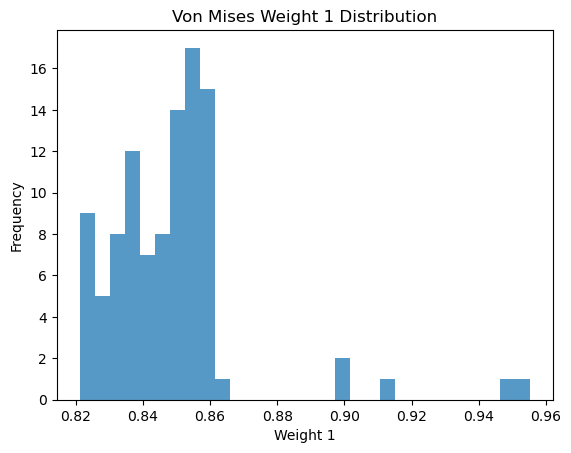

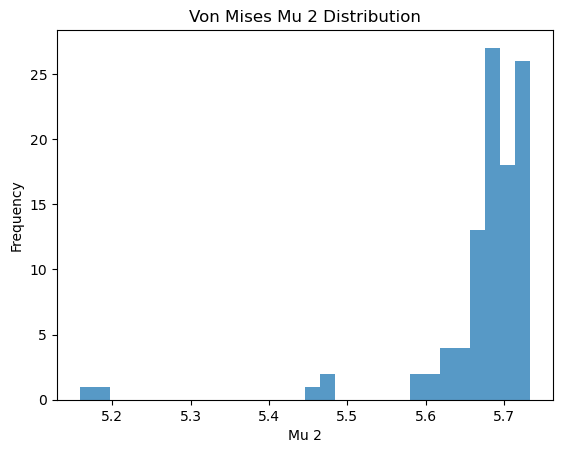

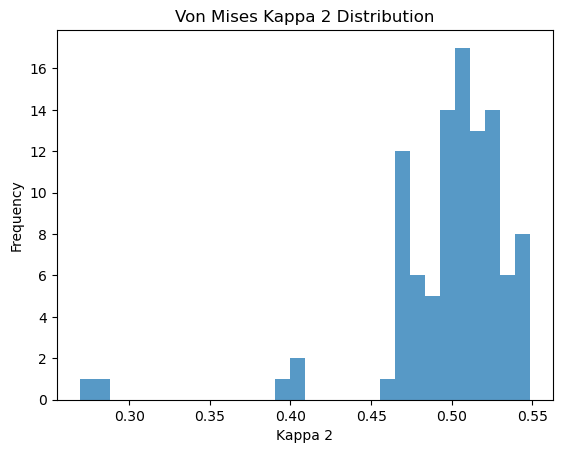

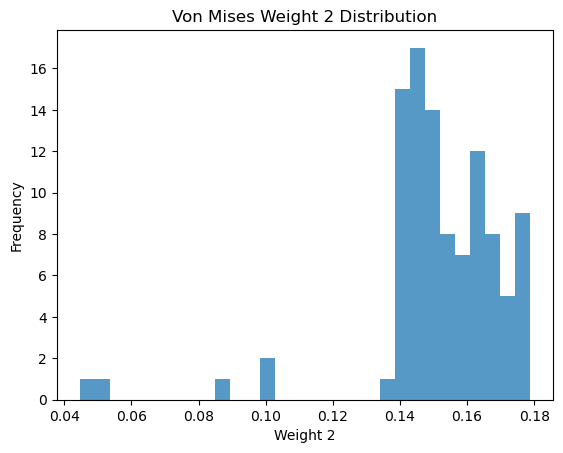

In [58]:
# -----------------------------------------------------------
# Define a helper function to plot histograms
#    for the collected parameters
# -----------------------------------------------------------
def plot_histogram(data, title, xlabel):
    """
    Plots a histogram of the provided data.

    Args:
        data (list): Data points to plot in a histogram.
        title (str): Title of the histogram plot.
        xlabel (str): X-axis label.
    """
    plt.figure()
    plt.hist(data, bins=30, alpha=0.75)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel('Frequency')
    plt.show()

# -----------------------------------------------------------
# Plot histograms for each parameter distribution
# -----------------------------------------------------------
plot_histogram(gamma_shape1_list, 'Gamma Shape 1 Distribution', 'Shape 1')
plot_histogram(gamma_scale1_list, 'Gamma Scale 1 Distribution', 'Scale 1')
plot_histogram(gamma_weight1_list, 'Gamma Weight 1 Distribution', 'Weight 1')
plot_histogram(gamma_shape2_list, 'Gamma Shape 2 Distribution', 'Shape 2')
plot_histogram(gamma_scale2_list, 'Gamma Scale 2 Distribution', 'Scale 2')
plot_histogram(gamma_weight2_list, 'Gamma Weight 2 Distribution', 'Weight 2')
plot_histogram(vonmises_mu1_list, 'Von Mises Mu 1 Distribution', 'Mu 1')
plot_histogram(vonmises_kappa1_list, 'Von Mises Kappa 1 Distribution', 'Kappa 1')
plot_histogram(vonmises_weight1_list, 'Von Mises Weight 1 Distribution', 'Weight 1')
plot_histogram(vonmises_mu2_list, 'Von Mises Mu 2 Distribution', 'Mu 2')
plot_histogram(vonmises_kappa2_list, 'Von Mises Kappa 2 Distribution', 'Kappa 2')
plot_histogram(vonmises_weight2_list, 'Von Mises Weight 2 Distribution', 'Weight 2')

# -----------------------------------------------------------
# Remove the hook to stop capturing outputs
#    in subsequent forward passes
# -----------------------------------------------------------
hook_handle.remove()